# **Pre-trained VGG-16 model trained on the KDEF dataset with input image resolution of 28x28.**

In [1]:
!pip install tensorboardX

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 9.5 MB/s eta 0:00:00


In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
from torch.utils.data import Dataset
import os
import copy
from tensorboardX import SummaryWriter
from PIL import Image
import torchvision.transforms as transforms
import random
plt.ion()   # interactive mode
%matplotlib inline

In [3]:
# Set fixed seed for reproducibility
seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

In [4]:
from zipfile import ZipFile
import os

zip_path = '/content/KEDF_downsample_28x28.zip'

extract_to = '/content'

os.makedirs(extract_to, exist_ok=True)

with ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)

print(f'✅ Files extracted to: {extract_to}')

✅ Files extracted to: /content


In [5]:
import os

classes = {
    "AF": 0, "AN": 1, "DI": 2, "HA": 3, "NE": 4, "SA": 5, "SU": 6
}

root='/content/KEDF_downsample_28x28'
invalid_files = []

for path, subdirs, files in os.walk(root):
    for name in files:
        if len(name) >= 6:
            emotion_code = name[4:6]
            if emotion_code not in classes:
                invalid_files.append(os.path.join(path, name))

# Print the problematic files
print("Found {} problematic files:".format(len(invalid_files)))
for file in invalid_files:
    print(file)

Found 0 problematic files:


In [6]:
class KDEFDataset(Dataset):
    def __init__(self, root='/content/KEDF_downsample_28x28', transforms_=None, idx=[]):
        self.transform = transforms_
        self.files = []

        for path, subdirs, files in os.walk(root):
            for name in files:
                self.files.append(os.path.join(path, name))

        self.files =  [self.files[i] for i in idx]
        self.classes = {
             "AF":0,
             "AN":1,
             "DI":2,
             "HA":3,
             "NE":4,
             "SA":5,
             "SU":6
        }
        for f in self.files:
          name = f.split('/')[-1]
          emotion_code = name[4:6]
          if emotion_code not in self.classes:
              print(f"Invalid file: {f} (code: {emotion_code})")

        for index in range(4900):
            filepath = self.files[index % len(self.files)]
            filename = filepath.split('/')[-1]
            if filename[4:6] not in self.classes:
                print(filepath)

    def __getitem__(self, index):
        filepath = self.files[index % len(self.files)]

        filename = filepath.split('/')[-1]
        img = self.transform(Image.open(filepath))
        label = self.classes[filename[4:6]]

        return img, label

    def __len__(self):
        return len(self.files)

Load Data
---------


In [7]:
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize(224),
        transforms.CenterCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
    ]),
    'val': transforms.Compose([
        transforms.Resize(224),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
    ]),
}

idx = np.random.permutation(4900)
idx = {'val': idx[0:490], 'train': idx[490:]}

g = torch.Generator()
g.manual_seed(42)

dataloaders = {
    x: torch.utils.data.DataLoader(
        KDEFDataset(transforms_=data_transforms[x], idx=idx[x]),
        batch_size=32,
        shuffle=True,
        generator=g
    )
    for x in ['train', 'val']
}

dataset_sizes = {x: len(idx[x]) for x in ['train', 'val']}
class_names = 7

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Visualize a few images


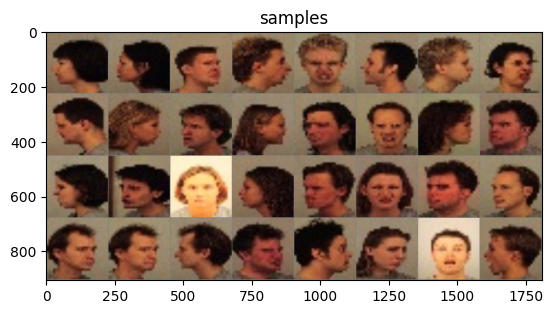

In [8]:
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.5, 0.5, 0.5])
    std = np.array([0.5, 0.5, 0.5])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated


# Get a batch of training data
inputs, classes = next(iter(dataloaders['train']))

# Make a grid from batch
out = torchvision.utils.make_grid(inputs)

imshow(out, title='samples')

Training the model
------------------

Now, let's write a general function to train a model. Here, we will
illustrate:

-  Scheduling the learning rate
-  Saving the best model

In the following, parameter ``scheduler`` is an LR scheduler object from
``torch.optim.lr_scheduler``.



In [9]:
from tqdm import tqdm

def train_model(model, criterion, optimizer, scheduler, dataloaders, writer=None, i=0,  num_epochs=25):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                scheduler.step()
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in tqdm(dataloaders[phase]):
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))


            writer.add_scalar(phase+"/loss", epoch_loss, epoch)
            writer.add_scalar(phase+"/acc", epoch_acc, epoch)


            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()


    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model, best_acc

Visualizing the model predictions

In [10]:
import imageio
import os
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont

def visualize_model_misclassified(model, dataloader, class_names, save_dir='misclassified', num_images=15, columns=3):
    os.makedirs(save_dir, exist_ok=True)
    was_training = model.training
    model.eval()
    images_so_far = 0
    rows = (num_images + columns - 1) // columns
    fig, axes = plt.subplots(rows, columns, figsize=(columns * 4, rows * 4))
    axes = axes.flatten()

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                if preds[j] != labels[j]:
                    if images_so_far >= num_images:
                        break

                    # --- Display in grid ---
                    ax = axes[images_so_far]
                    ax.axis('off')
                    ax.set_title(f'Pred: {class_names[int(preds[j])]},\nTrue: {class_names[int(labels[j])]}', fontsize=9)
                    imshow(inputs.cpu().data[j], ax=ax)

                    # --- Save image with overlay text ---
                    img = inputs[j].cpu().numpy().transpose(1, 2, 0)
                    img = (img * 0.5 + 0.5) * 255
                    img = img.astype(np.uint8)
                    img_pil = Image.fromarray(img)

                    draw = ImageDraw.Draw(img_pil)
                    font = ImageFont.load_default()
                    text = f'Predicted: {class_names[int(preds[j])]} | True: {class_names[int(labels[j])]}'
                    draw.rectangle([10, 10, 280, 25], fill=(255, 255, 255))
                    draw.text((10, 10), text, font=font, fill=(0, 0, 0))

                    img_pil.save(f'{save_dir}/misclassified_{images_so_far + 1}.jpg')

                    images_so_far += 1

    for k in range(images_so_far, len(axes)):
        axes[k].axis('off')

    plt.tight_layout()
    plt.show()
    model.train(mode=was_training)


def imshow(inp, ax=None, title=None):
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.5, 0.5, 0.5])
    std = np.array([0.5, 0.5, 0.5])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    if ax is None:
        plt.imshow(inp)
    else:
        ax.imshow(inp)
    if title is not None:
        ax.set_title(title)


Finetuning the convnet
----------------------

Load a pretrained model and reset final fully connected layer.




Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:02<00:00, 230MB/s]
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:224: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(


Epoch 0/19
----------


100%|██████████| 138/138 [00:16<00:00,  8.40it/s]


train Loss: 1.9549 Acc: 0.1605


100%|██████████| 16/16 [00:00<00:00, 16.18it/s]


val Loss: 1.9139 Acc: 0.2061

Epoch 1/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.44it/s]


train Loss: 1.8432 Acc: 0.2467


100%|██████████| 16/16 [00:00<00:00, 16.90it/s]


val Loss: 1.7754 Acc: 0.2857

Epoch 2/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.43it/s]


train Loss: 1.4899 Acc: 0.4143


100%|██████████| 16/16 [00:00<00:00, 17.12it/s]


val Loss: 1.2854 Acc: 0.4714

Epoch 3/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.41it/s]


train Loss: 1.2307 Acc: 0.5211


100%|██████████| 16/16 [00:00<00:00, 17.13it/s]


val Loss: 1.1887 Acc: 0.5429

Epoch 4/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.41it/s]


train Loss: 1.0661 Acc: 0.5846


100%|██████████| 16/16 [00:00<00:00, 17.38it/s]


val Loss: 1.0266 Acc: 0.6020

Epoch 5/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.48it/s]


train Loss: 0.8256 Acc: 0.6868


100%|██████████| 16/16 [00:00<00:00, 16.91it/s]


val Loss: 0.8989 Acc: 0.6449

Epoch 6/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.37it/s]


train Loss: 0.7739 Acc: 0.6989


100%|██████████| 16/16 [00:00<00:00, 16.80it/s]


val Loss: 0.8720 Acc: 0.6653

Epoch 7/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.48it/s]


train Loss: 0.7418 Acc: 0.7181


100%|██████████| 16/16 [00:00<00:00, 17.01it/s]


val Loss: 0.8259 Acc: 0.6918

Epoch 8/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.47it/s]


train Loss: 0.7223 Acc: 0.7283


100%|██████████| 16/16 [00:00<00:00, 17.17it/s]


val Loss: 0.8352 Acc: 0.6755

Epoch 9/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.52it/s]


train Loss: 0.6992 Acc: 0.7342


100%|██████████| 16/16 [00:00<00:00, 17.17it/s]


val Loss: 0.8102 Acc: 0.6898

Epoch 10/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.46it/s]


train Loss: 0.6768 Acc: 0.7379


100%|██████████| 16/16 [00:00<00:00, 17.25it/s]


val Loss: 0.7994 Acc: 0.7041

Epoch 11/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.47it/s]


train Loss: 0.6292 Acc: 0.7649


100%|██████████| 16/16 [00:00<00:00, 16.88it/s]


val Loss: 0.7894 Acc: 0.7020

Epoch 12/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.50it/s]


train Loss: 0.6376 Acc: 0.7590


100%|██████████| 16/16 [00:00<00:00, 17.22it/s]


val Loss: 0.7858 Acc: 0.7163

Epoch 13/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.42it/s]


train Loss: 0.6197 Acc: 0.7642


100%|██████████| 16/16 [00:00<00:00, 16.81it/s]


val Loss: 0.7843 Acc: 0.7184

Epoch 14/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.48it/s]


train Loss: 0.6263 Acc: 0.7630


100%|██████████| 16/16 [00:00<00:00, 17.05it/s]


val Loss: 0.7835 Acc: 0.7061

Epoch 15/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.50it/s]


train Loss: 0.6231 Acc: 0.7594


100%|██████████| 16/16 [00:00<00:00, 17.18it/s]


val Loss: 0.7828 Acc: 0.7143

Epoch 16/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.44it/s]


train Loss: 0.6145 Acc: 0.7653


100%|██████████| 16/16 [00:00<00:00, 16.75it/s]


val Loss: 0.7841 Acc: 0.7102

Epoch 17/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.48it/s]


train Loss: 0.6078 Acc: 0.7639


100%|██████████| 16/16 [00:00<00:00, 17.20it/s]


val Loss: 0.7832 Acc: 0.7122

Epoch 18/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.49it/s]


train Loss: 0.6169 Acc: 0.7596


100%|██████████| 16/16 [00:00<00:00, 16.90it/s]


val Loss: 0.7829 Acc: 0.7102

Epoch 19/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.47it/s]


train Loss: 0.6070 Acc: 0.7689


100%|██████████| 16/16 [00:00<00:00, 16.64it/s]


val Loss: 0.7821 Acc: 0.7122

Training complete in 5m 26s
Best val Acc: 0.718367
Showing misclassified examples for fold 0...


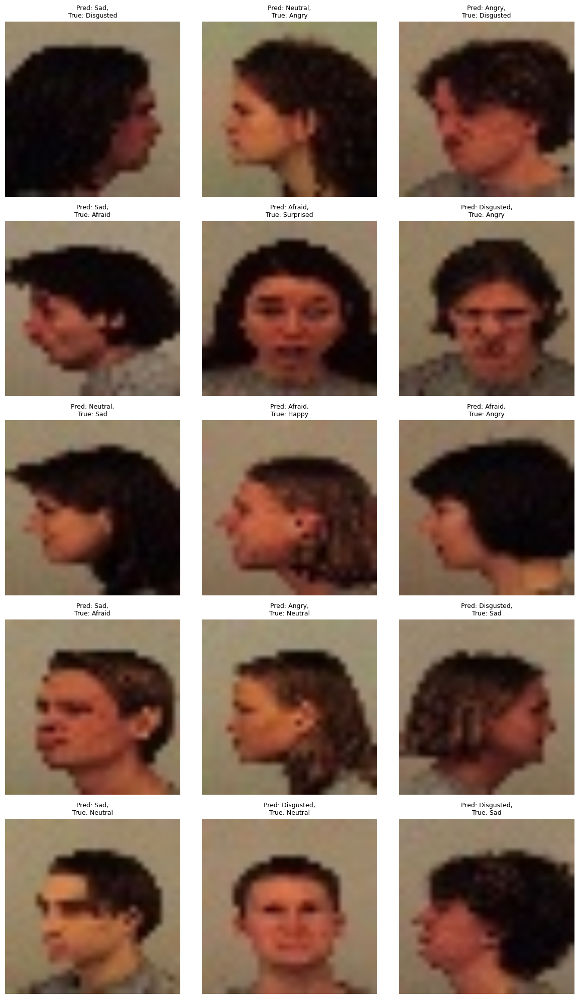




------------------------------------
 Accuracies  [0.7183673469387756]



Epoch 0/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.33it/s]


train Loss: 1.9417 Acc: 0.1726


100%|██████████| 16/16 [00:00<00:00, 17.03it/s]


val Loss: 1.8466 Acc: 0.2857

Epoch 1/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.30it/s]


train Loss: 1.7431 Acc: 0.3045


100%|██████████| 16/16 [00:00<00:00, 16.59it/s]


val Loss: 1.4670 Acc: 0.4429

Epoch 2/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.33it/s]


train Loss: 1.3780 Acc: 0.4567


100%|██████████| 16/16 [00:00<00:00, 16.50it/s]


val Loss: 1.2195 Acc: 0.5612

Epoch 3/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.28it/s]


train Loss: 1.1151 Acc: 0.5653


100%|██████████| 16/16 [00:00<00:00, 17.12it/s]


val Loss: 0.9823 Acc: 0.6163

Epoch 4/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.27it/s]


train Loss: 0.9756 Acc: 0.6259


100%|██████████| 16/16 [00:00<00:00, 16.57it/s]


val Loss: 0.9440 Acc: 0.6388

Epoch 5/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.23it/s]


train Loss: 0.7702 Acc: 0.7109


100%|██████████| 16/16 [00:00<00:00, 16.74it/s]


val Loss: 0.8294 Acc: 0.6714

Epoch 6/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.27it/s]


train Loss: 0.7132 Acc: 0.7265


100%|██████████| 16/16 [00:00<00:00, 16.72it/s]


val Loss: 0.7975 Acc: 0.7020

Epoch 7/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.31it/s]


train Loss: 0.6848 Acc: 0.7408


100%|██████████| 16/16 [00:00<00:00, 16.98it/s]


val Loss: 0.7919 Acc: 0.6980

Epoch 8/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.36it/s]


train Loss: 0.6589 Acc: 0.7587


100%|██████████| 16/16 [00:00<00:00, 16.86it/s]


val Loss: 0.8014 Acc: 0.7020

Epoch 9/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.34it/s]


train Loss: 0.6449 Acc: 0.7585


100%|██████████| 16/16 [00:00<00:00, 16.62it/s]


val Loss: 0.8036 Acc: 0.7102

Epoch 10/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.35it/s]


train Loss: 0.6257 Acc: 0.7655


100%|██████████| 16/16 [00:00<00:00, 16.96it/s]


val Loss: 0.7970 Acc: 0.7000

Epoch 11/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.39it/s]


train Loss: 0.5964 Acc: 0.7771


100%|██████████| 16/16 [00:01<00:00, 15.82it/s]


val Loss: 0.7762 Acc: 0.7163

Epoch 12/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.29it/s]


train Loss: 0.5848 Acc: 0.7764


100%|██████████| 16/16 [00:00<00:00, 16.84it/s]


val Loss: 0.7746 Acc: 0.7224

Epoch 13/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.37it/s]


train Loss: 0.5746 Acc: 0.7866


100%|██████████| 16/16 [00:00<00:00, 16.72it/s]


val Loss: 0.7730 Acc: 0.7184

Epoch 14/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.29it/s]


train Loss: 0.5733 Acc: 0.7839


100%|██████████| 16/16 [00:00<00:00, 16.66it/s]


val Loss: 0.7731 Acc: 0.7184

Epoch 15/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.39it/s]


train Loss: 0.5699 Acc: 0.7880


100%|██████████| 16/16 [00:00<00:00, 16.76it/s]


val Loss: 0.7766 Acc: 0.7102

Epoch 16/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.26it/s]


train Loss: 0.5649 Acc: 0.7844


100%|██████████| 16/16 [00:00<00:00, 16.41it/s]


val Loss: 0.7778 Acc: 0.7143

Epoch 17/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.30it/s]


train Loss: 0.5547 Acc: 0.7839


100%|██████████| 16/16 [00:00<00:00, 16.77it/s]


val Loss: 0.7751 Acc: 0.7102

Epoch 18/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.40it/s]


train Loss: 0.5682 Acc: 0.7889


100%|██████████| 16/16 [00:00<00:00, 16.92it/s]


val Loss: 0.7746 Acc: 0.7102

Epoch 19/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.36it/s]


train Loss: 0.5580 Acc: 0.7905


100%|██████████| 16/16 [00:00<00:00, 16.71it/s]


val Loss: 0.7743 Acc: 0.7102

Training complete in 5m 26s
Best val Acc: 0.722449
Showing misclassified examples for fold 1...


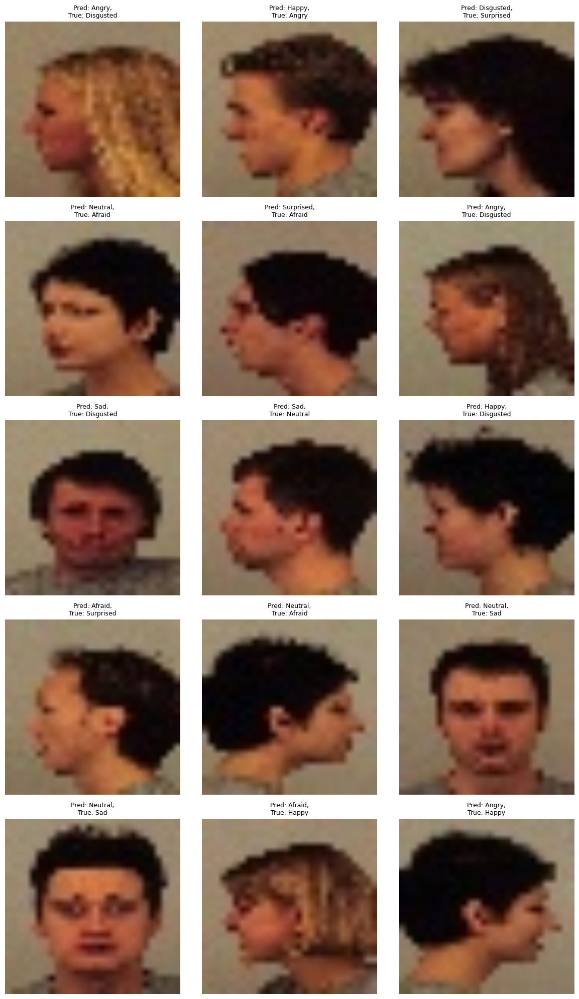




------------------------------------
 Accuracies  [0.7183673469387756, 0.7224489795918368]



Epoch 0/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.24it/s]


train Loss: 1.9357 Acc: 0.1776


100%|██████████| 16/16 [00:00<00:00, 16.15it/s]


val Loss: 1.8520 Acc: 0.2490

Epoch 1/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.16it/s]


train Loss: 1.7337 Acc: 0.3045


100%|██████████| 16/16 [00:00<00:00, 16.75it/s]


val Loss: 1.4742 Acc: 0.4367

Epoch 2/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.27it/s]


train Loss: 1.3436 Acc: 0.4798


100%|██████████| 16/16 [00:00<00:00, 17.01it/s]


val Loss: 1.1562 Acc: 0.5714

Epoch 3/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.26it/s]


train Loss: 1.1320 Acc: 0.5580


100%|██████████| 16/16 [00:00<00:00, 16.30it/s]


val Loss: 1.0024 Acc: 0.6184

Epoch 4/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.12it/s]


train Loss: 0.9860 Acc: 0.6172


100%|██████████| 16/16 [00:00<00:00, 16.63it/s]


val Loss: 0.8597 Acc: 0.6694

Epoch 5/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.20it/s]


train Loss: 0.7519 Acc: 0.7147


100%|██████████| 16/16 [00:00<00:00, 16.44it/s]


val Loss: 0.7717 Acc: 0.7061

Epoch 6/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.16it/s]


train Loss: 0.7070 Acc: 0.7281


100%|██████████| 16/16 [00:00<00:00, 16.45it/s]


val Loss: 0.7405 Acc: 0.7122

Epoch 7/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.17it/s]


train Loss: 0.6741 Acc: 0.7451


100%|██████████| 16/16 [00:00<00:00, 16.03it/s]


val Loss: 0.7467 Acc: 0.7061

Epoch 8/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.16it/s]


train Loss: 0.6512 Acc: 0.7587


100%|██████████| 16/16 [00:00<00:00, 16.94it/s]


val Loss: 0.7266 Acc: 0.7163

Epoch 9/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.23it/s]


train Loss: 0.6314 Acc: 0.7610


100%|██████████| 16/16 [00:00<00:00, 16.95it/s]


val Loss: 0.7151 Acc: 0.7347

Epoch 10/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.22it/s]


train Loss: 0.6122 Acc: 0.7658


100%|██████████| 16/16 [00:01<00:00, 15.68it/s]


val Loss: 0.7436 Acc: 0.7143

Epoch 11/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.22it/s]


train Loss: 0.5746 Acc: 0.7857


100%|██████████| 16/16 [00:00<00:00, 16.82it/s]


val Loss: 0.7060 Acc: 0.7388

Epoch 12/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.21it/s]


train Loss: 0.5689 Acc: 0.7848


100%|██████████| 16/16 [00:00<00:00, 17.21it/s]


val Loss: 0.7042 Acc: 0.7286

Epoch 13/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.17it/s]


train Loss: 0.5722 Acc: 0.7837


100%|██████████| 16/16 [00:01<00:00, 15.76it/s]


val Loss: 0.7091 Acc: 0.7306

Epoch 14/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.14it/s]


train Loss: 0.5605 Acc: 0.7884


100%|██████████| 16/16 [00:00<00:00, 16.39it/s]


val Loss: 0.7040 Acc: 0.7306

Epoch 15/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.22it/s]


train Loss: 0.5554 Acc: 0.7859


100%|██████████| 16/16 [00:00<00:00, 16.04it/s]


val Loss: 0.7043 Acc: 0.7327

Epoch 16/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.20it/s]


train Loss: 0.5553 Acc: 0.7909


100%|██████████| 16/16 [00:00<00:00, 16.65it/s]


val Loss: 0.7070 Acc: 0.7347

Epoch 17/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.26it/s]


train Loss: 0.5462 Acc: 0.7973


100%|██████████| 16/16 [00:00<00:00, 16.72it/s]


val Loss: 0.7054 Acc: 0.7327

Epoch 18/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.36it/s]


train Loss: 0.5511 Acc: 0.7961


100%|██████████| 16/16 [00:00<00:00, 16.42it/s]


val Loss: 0.7050 Acc: 0.7306

Epoch 19/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.17it/s]


train Loss: 0.5505 Acc: 0.7932


100%|██████████| 16/16 [00:00<00:00, 16.99it/s]


val Loss: 0.7052 Acc: 0.7327

Training complete in 5m 31s
Best val Acc: 0.738776
Showing misclassified examples for fold 2...


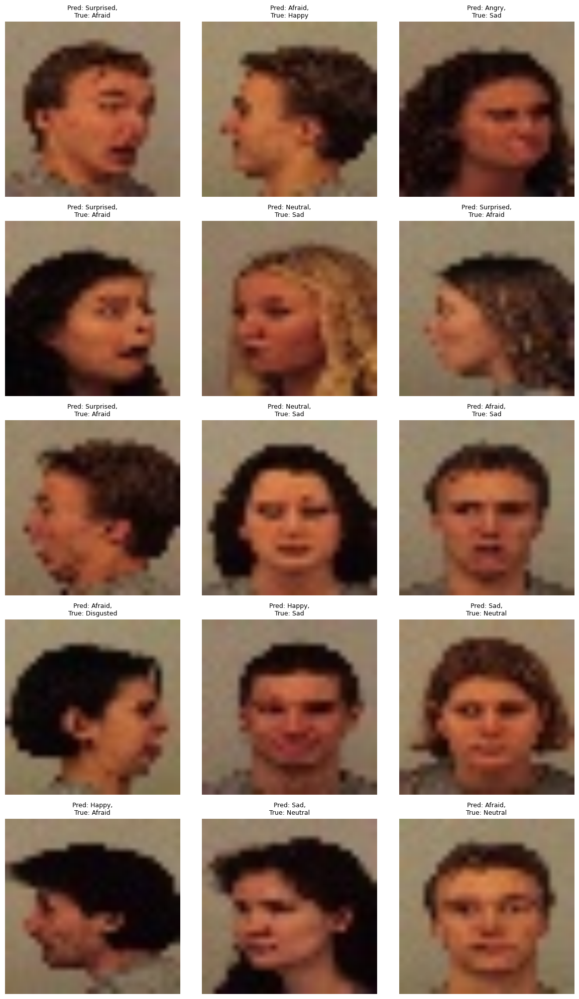




------------------------------------
 Accuracies  [0.7183673469387756, 0.7224489795918368, 0.7387755102040817]



Epoch 0/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.18it/s]


train Loss: 1.9450 Acc: 0.1642


100%|██████████| 16/16 [00:00<00:00, 16.76it/s]


val Loss: 1.8975 Acc: 0.2490

Epoch 1/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.18it/s]


train Loss: 1.7909 Acc: 0.2805


100%|██████████| 16/16 [00:00<00:00, 16.67it/s]


val Loss: 1.7204 Acc: 0.2776

Epoch 2/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.08it/s]


train Loss: 1.4780 Acc: 0.4211


100%|██████████| 16/16 [00:00<00:00, 16.78it/s]


val Loss: 1.2979 Acc: 0.4898

Epoch 3/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.19it/s]


train Loss: 1.1986 Acc: 0.5295


100%|██████████| 16/16 [00:00<00:00, 17.07it/s]


val Loss: 1.1340 Acc: 0.5551

Epoch 4/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.15it/s]


train Loss: 1.0384 Acc: 0.5977


100%|██████████| 16/16 [00:00<00:00, 16.53it/s]


val Loss: 0.9744 Acc: 0.6184

Epoch 5/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.20it/s]


train Loss: 0.7998 Acc: 0.6934


100%|██████████| 16/16 [00:00<00:00, 16.83it/s]


val Loss: 0.8566 Acc: 0.6776

Epoch 6/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.24it/s]


train Loss: 0.7622 Acc: 0.7063


100%|██████████| 16/16 [00:00<00:00, 16.28it/s]


val Loss: 0.8280 Acc: 0.6837

Epoch 7/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.21it/s]


train Loss: 0.7352 Acc: 0.7163


100%|██████████| 16/16 [00:00<00:00, 16.69it/s]


val Loss: 0.8208 Acc: 0.6776

Epoch 8/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.21it/s]


train Loss: 0.7002 Acc: 0.7379


100%|██████████| 16/16 [00:01<00:00, 15.51it/s]


val Loss: 0.8232 Acc: 0.6837

Epoch 9/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.18it/s]


train Loss: 0.6752 Acc: 0.7435


100%|██████████| 16/16 [00:00<00:00, 16.64it/s]


val Loss: 0.8045 Acc: 0.6816

Epoch 10/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.17it/s]


train Loss: 0.6476 Acc: 0.7515


100%|██████████| 16/16 [00:00<00:00, 16.96it/s]


val Loss: 0.7962 Acc: 0.6776

Epoch 11/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.24it/s]


train Loss: 0.6158 Acc: 0.7726


100%|██████████| 16/16 [00:00<00:00, 16.43it/s]


val Loss: 0.7724 Acc: 0.6878

Epoch 12/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.20it/s]


train Loss: 0.6095 Acc: 0.7685


100%|██████████| 16/16 [00:00<00:00, 16.80it/s]


val Loss: 0.7724 Acc: 0.6959

Epoch 13/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.24it/s]


train Loss: 0.6027 Acc: 0.7726


100%|██████████| 16/16 [00:00<00:00, 16.33it/s]


val Loss: 0.7711 Acc: 0.6939

Epoch 14/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.23it/s]


train Loss: 0.6033 Acc: 0.7664


100%|██████████| 16/16 [00:00<00:00, 16.83it/s]


val Loss: 0.7716 Acc: 0.6959

Epoch 15/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.15it/s]


train Loss: 0.5997 Acc: 0.7723


100%|██████████| 16/16 [00:00<00:00, 16.50it/s]


val Loss: 0.7735 Acc: 0.6959

Epoch 16/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.17it/s]


train Loss: 0.5967 Acc: 0.7746


100%|██████████| 16/16 [00:00<00:00, 16.13it/s]


val Loss: 0.7751 Acc: 0.6939

Epoch 17/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.24it/s]


train Loss: 0.5932 Acc: 0.7791


100%|██████████| 16/16 [00:00<00:00, 16.76it/s]


val Loss: 0.7731 Acc: 0.6980

Epoch 18/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.15it/s]


train Loss: 0.5943 Acc: 0.7741


100%|██████████| 16/16 [00:00<00:00, 16.92it/s]


val Loss: 0.7727 Acc: 0.6959

Epoch 19/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.12it/s]


train Loss: 0.5935 Acc: 0.7710


100%|██████████| 16/16 [00:00<00:00, 16.46it/s]


val Loss: 0.7715 Acc: 0.6980

Training complete in 5m 32s
Best val Acc: 0.697959
Showing misclassified examples for fold 3...


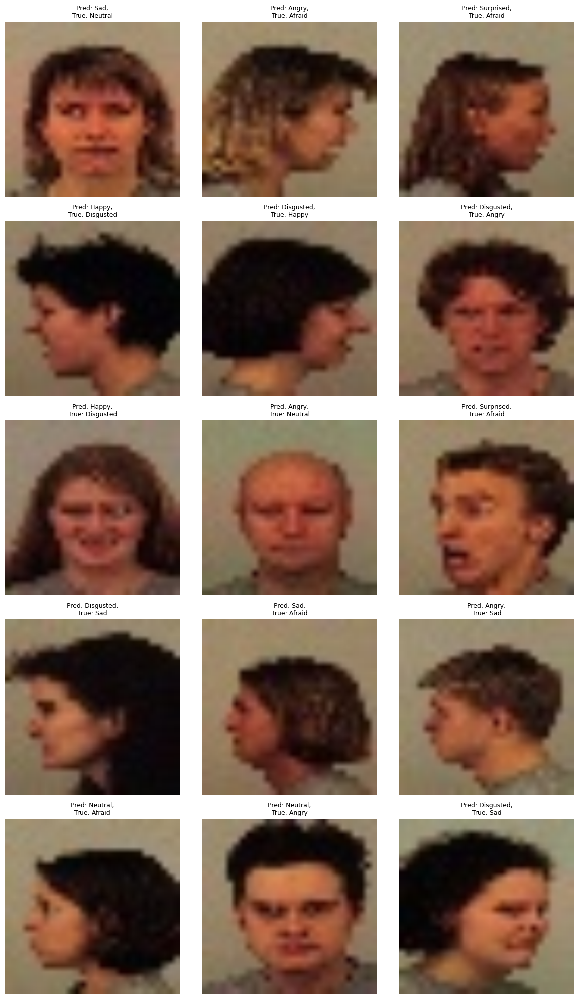




------------------------------------
 Accuracies  [0.7183673469387756, 0.7224489795918368, 0.7387755102040817, 0.6979591836734694]



Epoch 0/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.30it/s]


train Loss: 1.9539 Acc: 0.1546


100%|██████████| 16/16 [00:00<00:00, 16.73it/s]


val Loss: 1.9233 Acc: 0.2327

Epoch 1/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.17it/s]


train Loss: 1.8224 Acc: 0.2621


100%|██████████| 16/16 [00:00<00:00, 16.49it/s]


val Loss: 1.7118 Acc: 0.3041

Epoch 2/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.24it/s]


train Loss: 1.4357 Acc: 0.4420


100%|██████████| 16/16 [00:00<00:00, 16.79it/s]


val Loss: 1.3933 Acc: 0.4796

Epoch 3/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.20it/s]


train Loss: 1.1919 Acc: 0.5456


100%|██████████| 16/16 [00:00<00:00, 16.43it/s]


val Loss: 1.0999 Acc: 0.5653

Epoch 4/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.12it/s]


train Loss: 1.0657 Acc: 0.5893


100%|██████████| 16/16 [00:00<00:00, 16.64it/s]


val Loss: 1.0546 Acc: 0.6102

Epoch 5/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.31it/s]


train Loss: 0.8269 Acc: 0.6853


100%|██████████| 16/16 [00:00<00:00, 17.01it/s]


val Loss: 0.9028 Acc: 0.6469

Epoch 6/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.20it/s]


train Loss: 0.7720 Acc: 0.7061


100%|██████████| 16/16 [00:01<00:00, 15.98it/s]


val Loss: 0.8931 Acc: 0.6388

Epoch 7/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.15it/s]


train Loss: 0.7361 Acc: 0.7138


100%|██████████| 16/16 [00:00<00:00, 16.71it/s]


val Loss: 0.8664 Acc: 0.6510

Epoch 8/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.18it/s]


train Loss: 0.7278 Acc: 0.7172


100%|██████████| 16/16 [00:00<00:00, 16.56it/s]


val Loss: 0.8483 Acc: 0.6653

Epoch 9/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.17it/s]


train Loss: 0.6931 Acc: 0.7338


100%|██████████| 16/16 [00:00<00:00, 16.69it/s]


val Loss: 0.8504 Acc: 0.6653

Epoch 10/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.17it/s]


train Loss: 0.6656 Acc: 0.7433


100%|██████████| 16/16 [00:00<00:00, 16.15it/s]


val Loss: 0.8406 Acc: 0.6633

Epoch 11/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.25it/s]


train Loss: 0.6415 Acc: 0.7503


100%|██████████| 16/16 [00:00<00:00, 16.72it/s]


val Loss: 0.8275 Acc: 0.6796

Epoch 12/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.22it/s]


train Loss: 0.6317 Acc: 0.7553


100%|██████████| 16/16 [00:01<00:00, 15.39it/s]


val Loss: 0.8250 Acc: 0.6878

Epoch 13/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.18it/s]


train Loss: 0.6224 Acc: 0.7642


100%|██████████| 16/16 [00:00<00:00, 16.88it/s]


val Loss: 0.8241 Acc: 0.6796

Epoch 14/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.25it/s]


train Loss: 0.6316 Acc: 0.7571


100%|██████████| 16/16 [00:00<00:00, 17.08it/s]


val Loss: 0.8239 Acc: 0.6837

Epoch 15/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.23it/s]


train Loss: 0.6173 Acc: 0.7630


100%|██████████| 16/16 [00:00<00:00, 16.73it/s]


val Loss: 0.8224 Acc: 0.6796

Epoch 16/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.28it/s]


train Loss: 0.6150 Acc: 0.7642


100%|██████████| 16/16 [00:01<00:00, 15.41it/s]


val Loss: 0.8244 Acc: 0.6755

Epoch 17/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.32it/s]


train Loss: 0.6112 Acc: 0.7637


100%|██████████| 16/16 [00:00<00:00, 16.48it/s]


val Loss: 0.8235 Acc: 0.6796

Epoch 18/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.23it/s]


train Loss: 0.6091 Acc: 0.7721


100%|██████████| 16/16 [00:00<00:00, 16.41it/s]


val Loss: 0.8227 Acc: 0.6796

Epoch 19/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.31it/s]


train Loss: 0.6167 Acc: 0.7619


100%|██████████| 16/16 [00:00<00:00, 16.94it/s]


val Loss: 0.8229 Acc: 0.6816

Training complete in 5m 30s
Best val Acc: 0.687755
Showing misclassified examples for fold 4...


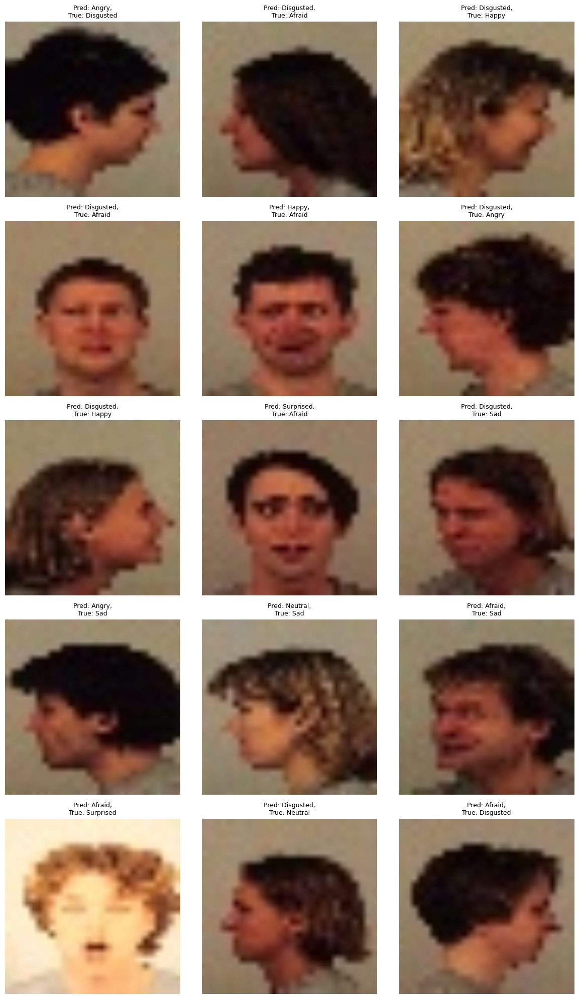




------------------------------------
 Accuracies  [0.7183673469387756, 0.7224489795918368, 0.7387755102040817, 0.6979591836734694, 0.6877551020408164]



Epoch 0/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.31it/s]


train Loss: 1.9364 Acc: 0.1764


100%|██████████| 16/16 [00:00<00:00, 16.83it/s]


val Loss: 1.8658 Acc: 0.2714

Epoch 1/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.27it/s]


train Loss: 1.6538 Acc: 0.3488


100%|██████████| 16/16 [00:01<00:00, 15.83it/s]


val Loss: 1.4445 Acc: 0.4184

Epoch 2/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.22it/s]


train Loss: 1.2847 Acc: 0.5025


100%|██████████| 16/16 [00:00<00:00, 16.15it/s]


val Loss: 1.2058 Acc: 0.5082

Epoch 3/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.17it/s]


train Loss: 1.0827 Acc: 0.5821


100%|██████████| 16/16 [00:00<00:00, 16.66it/s]


val Loss: 1.0428 Acc: 0.5755

Epoch 4/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.22it/s]


train Loss: 0.9585 Acc: 0.6222


100%|██████████| 16/16 [00:00<00:00, 16.76it/s]


val Loss: 1.0146 Acc: 0.6184

Epoch 5/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.24it/s]


train Loss: 0.7509 Acc: 0.7170


100%|██████████| 16/16 [00:00<00:00, 16.11it/s]


val Loss: 0.8728 Acc: 0.6510

Epoch 6/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.14it/s]


train Loss: 0.6949 Acc: 0.7315


100%|██████████| 16/16 [00:00<00:00, 16.93it/s]


val Loss: 0.8729 Acc: 0.6531

Epoch 7/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.24it/s]


train Loss: 0.6778 Acc: 0.7374


100%|██████████| 16/16 [00:00<00:00, 16.60it/s]


val Loss: 0.8563 Acc: 0.6653

Epoch 8/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.18it/s]


train Loss: 0.6490 Acc: 0.7535


100%|██████████| 16/16 [00:00<00:00, 16.75it/s]


val Loss: 0.8370 Acc: 0.6653

Epoch 9/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.32it/s]


train Loss: 0.6381 Acc: 0.7567


100%|██████████| 16/16 [00:00<00:00, 16.40it/s]


val Loss: 0.8317 Acc: 0.6694

Epoch 10/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.23it/s]


train Loss: 0.6146 Acc: 0.7653


100%|██████████| 16/16 [00:00<00:00, 16.71it/s]


val Loss: 0.8502 Acc: 0.6837

Epoch 11/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.30it/s]


train Loss: 0.5845 Acc: 0.7785


100%|██████████| 16/16 [00:00<00:00, 17.13it/s]


val Loss: 0.8190 Acc: 0.6776

Epoch 12/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.20it/s]


train Loss: 0.5695 Acc: 0.7857


100%|██████████| 16/16 [00:00<00:00, 16.35it/s]


val Loss: 0.8165 Acc: 0.6857

Epoch 13/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.23it/s]


train Loss: 0.5697 Acc: 0.7918


100%|██████████| 16/16 [00:00<00:00, 16.44it/s]


val Loss: 0.8185 Acc: 0.6816

Epoch 14/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.24it/s]


train Loss: 0.5596 Acc: 0.7914


100%|██████████| 16/16 [00:01<00:00, 15.84it/s]


val Loss: 0.8156 Acc: 0.6898

Epoch 15/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.25it/s]


train Loss: 0.5671 Acc: 0.7837


100%|██████████| 16/16 [00:00<00:00, 17.00it/s]


val Loss: 0.8184 Acc: 0.6918

Epoch 16/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.23it/s]


train Loss: 0.5594 Acc: 0.7918


100%|██████████| 16/16 [00:00<00:00, 17.06it/s]


val Loss: 0.8168 Acc: 0.6898

Epoch 17/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.19it/s]


train Loss: 0.5629 Acc: 0.7934


100%|██████████| 16/16 [00:00<00:00, 16.84it/s]


val Loss: 0.8165 Acc: 0.6939

Epoch 18/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.28it/s]


train Loss: 0.5542 Acc: 0.7902


100%|██████████| 16/16 [00:01<00:00, 15.64it/s]


val Loss: 0.8164 Acc: 0.6939

Epoch 19/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.14it/s]


train Loss: 0.5520 Acc: 0.7957


100%|██████████| 16/16 [00:00<00:00, 16.96it/s]


val Loss: 0.8167 Acc: 0.6959

Training complete in 5m 35s
Best val Acc: 0.695918
Showing misclassified examples for fold 5...


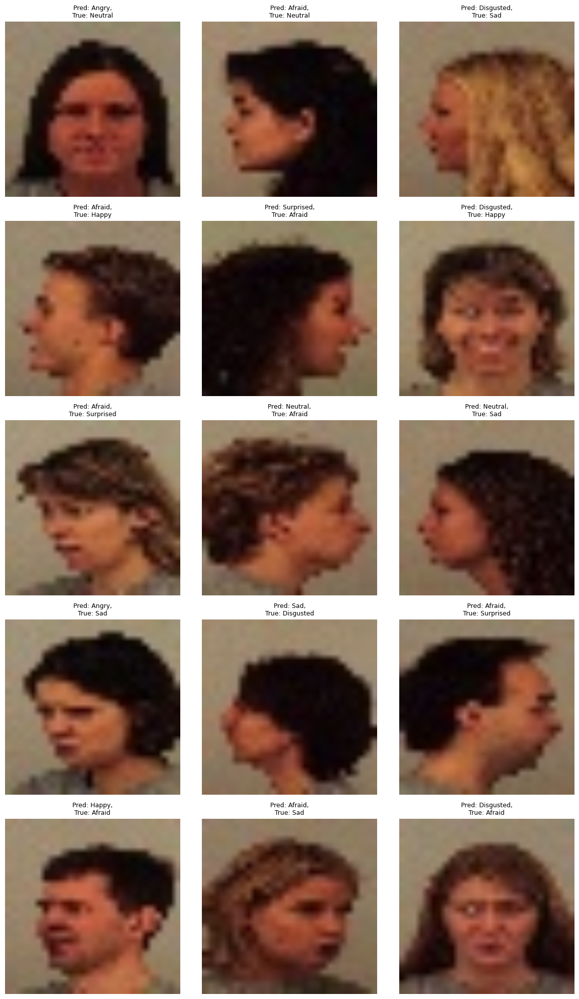




------------------------------------
 Accuracies  [0.7183673469387756, 0.7224489795918368, 0.7387755102040817, 0.6979591836734694, 0.6877551020408164, 0.6959183673469388]



Epoch 0/19
----------


100%|██████████| 138/138 [00:15<00:00,  8.98it/s]


train Loss: 1.9418 Acc: 0.1771


100%|██████████| 16/16 [00:00<00:00, 16.35it/s]


val Loss: 1.8678 Acc: 0.2388

Epoch 1/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.25it/s]


train Loss: 1.6613 Acc: 0.3358


100%|██████████| 16/16 [00:00<00:00, 16.62it/s]


val Loss: 1.4316 Acc: 0.4837

Epoch 2/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.18it/s]


train Loss: 1.2955 Acc: 0.4968


100%|██████████| 16/16 [00:00<00:00, 16.01it/s]


val Loss: 1.1425 Acc: 0.5612

Epoch 3/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.19it/s]


train Loss: 1.1093 Acc: 0.5789


100%|██████████| 16/16 [00:00<00:00, 16.89it/s]


val Loss: 1.1120 Acc: 0.5531

Epoch 4/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.28it/s]


train Loss: 0.9452 Acc: 0.6342


100%|██████████| 16/16 [00:00<00:00, 16.34it/s]


val Loss: 0.9107 Acc: 0.6776

Epoch 5/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.19it/s]


train Loss: 0.7239 Acc: 0.7281


100%|██████████| 16/16 [00:00<00:00, 16.77it/s]


val Loss: 0.8388 Acc: 0.6837

Epoch 6/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.28it/s]


train Loss: 0.6798 Acc: 0.7424


100%|██████████| 16/16 [00:00<00:00, 16.83it/s]


val Loss: 0.8696 Acc: 0.6796

Epoch 7/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.19it/s]


train Loss: 0.6549 Acc: 0.7621


100%|██████████| 16/16 [00:00<00:00, 16.98it/s]


val Loss: 0.8477 Acc: 0.6918

Epoch 8/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.21it/s]


train Loss: 0.6254 Acc: 0.7680


100%|██████████| 16/16 [00:00<00:00, 16.87it/s]


val Loss: 0.8136 Acc: 0.7020

Epoch 9/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.24it/s]


train Loss: 0.6180 Acc: 0.7653


100%|██████████| 16/16 [00:00<00:00, 16.58it/s]


val Loss: 0.8223 Acc: 0.6857

Epoch 10/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.30it/s]


train Loss: 0.5923 Acc: 0.7798


100%|██████████| 16/16 [00:00<00:00, 16.42it/s]


val Loss: 0.8010 Acc: 0.6878

Epoch 11/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.27it/s]


train Loss: 0.5486 Acc: 0.7957


100%|██████████| 16/16 [00:01<00:00, 15.55it/s]


val Loss: 0.8019 Acc: 0.6959

Epoch 12/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.19it/s]


train Loss: 0.5470 Acc: 0.7884


100%|██████████| 16/16 [00:00<00:00, 16.65it/s]


val Loss: 0.8040 Acc: 0.6918

Epoch 13/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.14it/s]


train Loss: 0.5355 Acc: 0.7968


100%|██████████| 16/16 [00:00<00:00, 16.87it/s]


val Loss: 0.8074 Acc: 0.6857

Epoch 14/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.26it/s]


train Loss: 0.5384 Acc: 0.8029


100%|██████████| 16/16 [00:00<00:00, 16.79it/s]


val Loss: 0.8030 Acc: 0.6918

Epoch 15/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.30it/s]


train Loss: 0.5369 Acc: 0.8032


100%|██████████| 16/16 [00:00<00:00, 17.10it/s]


val Loss: 0.8021 Acc: 0.6939

Epoch 16/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.28it/s]


train Loss: 0.5344 Acc: 0.7991


100%|██████████| 16/16 [00:00<00:00, 16.12it/s]


val Loss: 0.8090 Acc: 0.6939

Epoch 17/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.26it/s]


train Loss: 0.5327 Acc: 0.7975


100%|██████████| 16/16 [00:00<00:00, 16.10it/s]


val Loss: 0.8068 Acc: 0.6918

Epoch 18/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.36it/s]


train Loss: 0.5439 Acc: 0.7946


100%|██████████| 16/16 [00:00<00:00, 17.13it/s]


val Loss: 0.8051 Acc: 0.6918

Epoch 19/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.24it/s]


train Loss: 0.5287 Acc: 0.7980


100%|██████████| 16/16 [00:00<00:00, 16.40it/s]


val Loss: 0.8044 Acc: 0.6918

Training complete in 5m 26s
Best val Acc: 0.702041
Showing misclassified examples for fold 6...


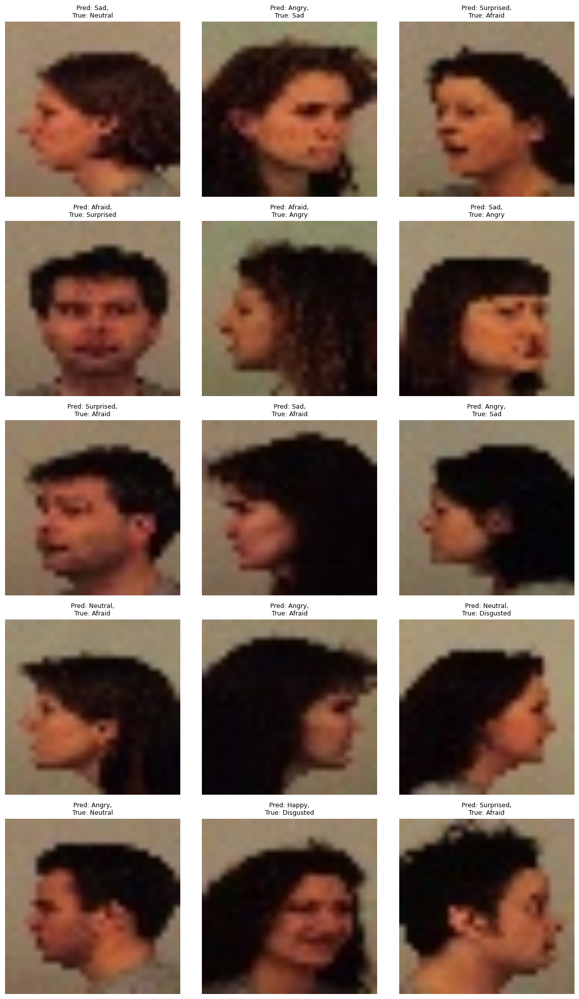




------------------------------------
 Accuracies  [0.7183673469387756, 0.7224489795918368, 0.7387755102040817, 0.6979591836734694, 0.6877551020408164, 0.6959183673469388, 0.7020408163265307]



Epoch 0/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.15it/s]


train Loss: 1.9446 Acc: 0.1714


100%|██████████| 16/16 [00:00<00:00, 17.04it/s]


val Loss: 1.8848 Acc: 0.2571

Epoch 1/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.27it/s]


train Loss: 1.7714 Acc: 0.2927


100%|██████████| 16/16 [00:01<00:00, 15.92it/s]


val Loss: 1.4849 Acc: 0.4469

Epoch 2/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.21it/s]


train Loss: 1.3994 Acc: 0.4531


100%|██████████| 16/16 [00:00<00:00, 17.12it/s]


val Loss: 1.1346 Acc: 0.5755

Epoch 3/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.13it/s]


train Loss: 1.1641 Acc: 0.5447


100%|██████████| 16/16 [00:00<00:00, 16.21it/s]


val Loss: 1.0290 Acc: 0.6082

Epoch 4/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.27it/s]


train Loss: 1.0112 Acc: 0.6020


100%|██████████| 16/16 [00:00<00:00, 17.04it/s]


val Loss: 1.0614 Acc: 0.5796

Epoch 5/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.24it/s]


train Loss: 0.8160 Acc: 0.6880


100%|██████████| 16/16 [00:00<00:00, 16.64it/s]


val Loss: 0.8385 Acc: 0.6653

Epoch 6/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.22it/s]


train Loss: 0.7516 Acc: 0.7050


100%|██████████| 16/16 [00:00<00:00, 16.74it/s]


val Loss: 0.8501 Acc: 0.6653

Epoch 7/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.35it/s]


train Loss: 0.7249 Acc: 0.7186


100%|██████████| 16/16 [00:01<00:00, 15.39it/s]


val Loss: 0.8002 Acc: 0.6898

Epoch 8/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.29it/s]


train Loss: 0.7071 Acc: 0.7254


100%|██████████| 16/16 [00:00<00:00, 16.84it/s]


val Loss: 0.7940 Acc: 0.6980

Epoch 9/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.16it/s]


train Loss: 0.6804 Acc: 0.7422


100%|██████████| 16/16 [00:01<00:00, 15.55it/s]


val Loss: 0.7960 Acc: 0.6939

Epoch 10/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.23it/s]


train Loss: 0.6567 Acc: 0.7490


100%|██████████| 16/16 [00:00<00:00, 16.25it/s]


val Loss: 0.7941 Acc: 0.6735

Epoch 11/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.32it/s]


train Loss: 0.6186 Acc: 0.7639


100%|██████████| 16/16 [00:00<00:00, 16.22it/s]


val Loss: 0.7773 Acc: 0.6898

Epoch 12/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.33it/s]


train Loss: 0.6138 Acc: 0.7680


100%|██████████| 16/16 [00:00<00:00, 16.37it/s]


val Loss: 0.7728 Acc: 0.6796

Epoch 13/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.40it/s]


train Loss: 0.6151 Acc: 0.7662


100%|██████████| 16/16 [00:00<00:00, 16.55it/s]


val Loss: 0.7827 Acc: 0.6939

Epoch 14/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.28it/s]


train Loss: 0.6076 Acc: 0.7719


100%|██████████| 16/16 [00:01<00:00, 15.86it/s]


val Loss: 0.7783 Acc: 0.6837

Epoch 15/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.22it/s]


train Loss: 0.6113 Acc: 0.7685


100%|██████████| 16/16 [00:00<00:00, 16.29it/s]


val Loss: 0.7812 Acc: 0.6939

Epoch 16/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.32it/s]


train Loss: 0.6134 Acc: 0.7653


100%|██████████| 16/16 [00:00<00:00, 16.62it/s]


val Loss: 0.7764 Acc: 0.6898

Epoch 17/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.27it/s]


train Loss: 0.5999 Acc: 0.7728


100%|██████████| 16/16 [00:00<00:00, 16.31it/s]


val Loss: 0.7760 Acc: 0.6918

Epoch 18/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.30it/s]


train Loss: 0.6001 Acc: 0.7778


100%|██████████| 16/16 [00:00<00:00, 16.95it/s]


val Loss: 0.7753 Acc: 0.6939

Epoch 19/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.28it/s]


train Loss: 0.6048 Acc: 0.7726


100%|██████████| 16/16 [00:00<00:00, 16.43it/s]


val Loss: 0.7754 Acc: 0.6918

Training complete in 5m 25s
Best val Acc: 0.697959
Showing misclassified examples for fold 7...


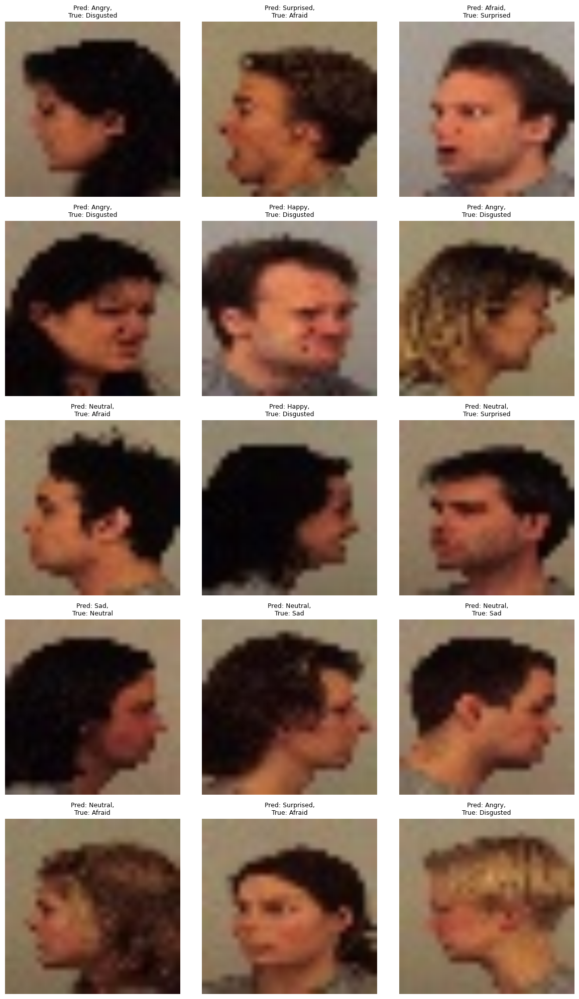




------------------------------------
 Accuracies  [0.7183673469387756, 0.7224489795918368, 0.7387755102040817, 0.6979591836734694, 0.6877551020408164, 0.6959183673469388, 0.7020408163265307, 0.6979591836734694]



Epoch 0/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.19it/s]


train Loss: 1.9499 Acc: 0.1694


100%|██████████| 16/16 [00:00<00:00, 16.28it/s]


val Loss: 1.9068 Acc: 0.2020

Epoch 1/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.15it/s]


train Loss: 1.7502 Acc: 0.3014


100%|██████████| 16/16 [00:01<00:00, 15.14it/s]


val Loss: 1.6468 Acc: 0.3347

Epoch 2/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.17it/s]


train Loss: 1.4214 Acc: 0.4481


100%|██████████| 16/16 [00:00<00:00, 16.73it/s]


val Loss: 1.2896 Acc: 0.5122

Epoch 3/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.18it/s]


train Loss: 1.1791 Acc: 0.5433


100%|██████████| 16/16 [00:00<00:00, 16.23it/s]


val Loss: 1.2187 Acc: 0.5245

Epoch 4/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.15it/s]


train Loss: 1.0481 Acc: 0.5968


100%|██████████| 16/16 [00:00<00:00, 16.32it/s]


val Loss: 1.0868 Acc: 0.5816

Epoch 5/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.29it/s]


train Loss: 0.8234 Acc: 0.6821


100%|██████████| 16/16 [00:00<00:00, 16.22it/s]


val Loss: 0.9779 Acc: 0.6143

Epoch 6/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.25it/s]


train Loss: 0.7625 Acc: 0.7036


100%|██████████| 16/16 [00:01<00:00, 15.83it/s]


val Loss: 0.9521 Acc: 0.6286

Epoch 7/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.25it/s]


train Loss: 0.7270 Acc: 0.7145


100%|██████████| 16/16 [00:01<00:00, 15.89it/s]


val Loss: 0.9636 Acc: 0.6163

Epoch 8/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.25it/s]


train Loss: 0.6973 Acc: 0.7308


100%|██████████| 16/16 [00:00<00:00, 16.47it/s]


val Loss: 0.9216 Acc: 0.6388

Epoch 9/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.18it/s]


train Loss: 0.6809 Acc: 0.7415


100%|██████████| 16/16 [00:00<00:00, 16.38it/s]


val Loss: 0.9619 Acc: 0.6245

Epoch 10/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.19it/s]


train Loss: 0.6701 Acc: 0.7401


100%|██████████| 16/16 [00:00<00:00, 16.73it/s]


val Loss: 0.9438 Acc: 0.6510

Epoch 11/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.22it/s]


train Loss: 0.6337 Acc: 0.7615


100%|██████████| 16/16 [00:00<00:00, 16.86it/s]


val Loss: 0.9158 Acc: 0.6551

Epoch 12/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.22it/s]


train Loss: 0.6231 Acc: 0.7717


100%|██████████| 16/16 [00:01<00:00, 15.63it/s]


val Loss: 0.9125 Acc: 0.6531

Epoch 13/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.28it/s]


train Loss: 0.6139 Acc: 0.7692


100%|██████████| 16/16 [00:00<00:00, 16.33it/s]


val Loss: 0.9149 Acc: 0.6551

Epoch 14/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.33it/s]


train Loss: 0.6211 Acc: 0.7615


100%|██████████| 16/16 [00:00<00:00, 16.00it/s]


val Loss: 0.9138 Acc: 0.6531

Epoch 15/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.22it/s]


train Loss: 0.6141 Acc: 0.7639


100%|██████████| 16/16 [00:00<00:00, 16.86it/s]


val Loss: 0.9087 Acc: 0.6571

Epoch 16/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.21it/s]


train Loss: 0.6217 Acc: 0.7637


100%|██████████| 16/16 [00:00<00:00, 16.79it/s]


val Loss: 0.9168 Acc: 0.6592

Epoch 17/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.30it/s]


train Loss: 0.5969 Acc: 0.7778


100%|██████████| 16/16 [00:01<00:00, 14.96it/s]


val Loss: 0.9123 Acc: 0.6612

Epoch 18/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.19it/s]


train Loss: 0.6077 Acc: 0.7739


100%|██████████| 16/16 [00:00<00:00, 16.69it/s]


val Loss: 0.9110 Acc: 0.6612

Epoch 19/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.27it/s]


train Loss: 0.6095 Acc: 0.7741


100%|██████████| 16/16 [00:01<00:00, 15.99it/s]


val Loss: 0.9104 Acc: 0.6571

Training complete in 5m 33s
Best val Acc: 0.661224
Showing misclassified examples for fold 8...


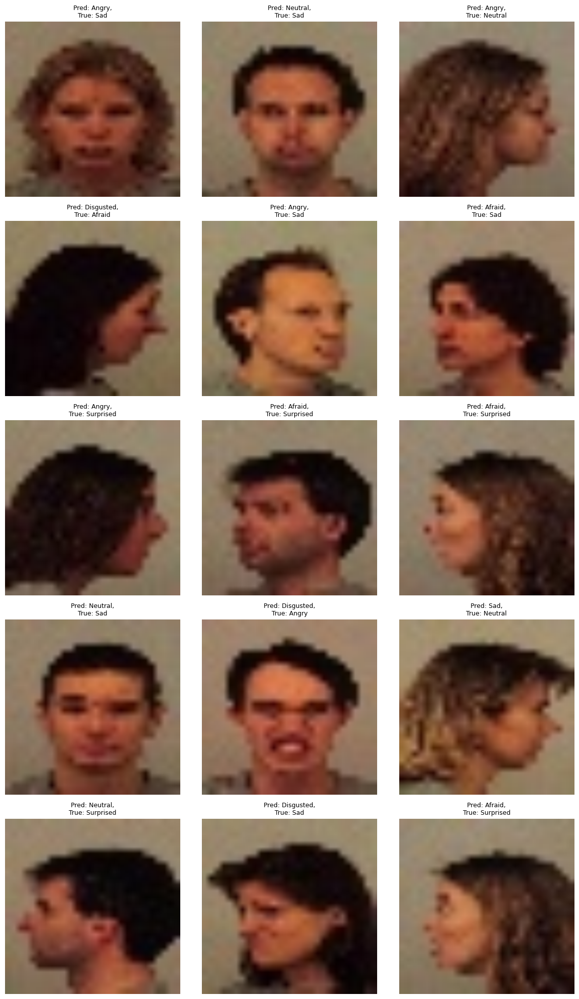




------------------------------------
 Accuracies  [0.7183673469387756, 0.7224489795918368, 0.7387755102040817, 0.6979591836734694, 0.6877551020408164, 0.6959183673469388, 0.7020408163265307, 0.6979591836734694, 0.6612244897959184]



Epoch 0/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.29it/s]


train Loss: 1.9508 Acc: 0.1705


100%|██████████| 16/16 [00:00<00:00, 16.02it/s]


val Loss: 1.8984 Acc: 0.2020

Epoch 1/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.27it/s]


train Loss: 1.7256 Acc: 0.2995


100%|██████████| 16/16 [00:00<00:00, 16.21it/s]


val Loss: 1.5326 Acc: 0.3959

Epoch 2/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.27it/s]


train Loss: 1.3649 Acc: 0.4667


100%|██████████| 16/16 [00:01<00:00, 15.52it/s]


val Loss: 1.3356 Acc: 0.4673

Epoch 3/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.18it/s]


train Loss: 1.1207 Acc: 0.5683


100%|██████████| 16/16 [00:00<00:00, 16.24it/s]


val Loss: 1.0374 Acc: 0.6122

Epoch 4/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.27it/s]


train Loss: 0.9933 Acc: 0.6109


100%|██████████| 16/16 [00:00<00:00, 16.70it/s]


val Loss: 0.9806 Acc: 0.6122

Epoch 5/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.25it/s]


train Loss: 0.7785 Acc: 0.7036


100%|██████████| 16/16 [00:00<00:00, 16.53it/s]


val Loss: 0.8609 Acc: 0.6694

Epoch 6/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.31it/s]


train Loss: 0.7260 Acc: 0.7238


100%|██████████| 16/16 [00:00<00:00, 16.91it/s]


val Loss: 0.8475 Acc: 0.6816

Epoch 7/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.27it/s]


train Loss: 0.7003 Acc: 0.7361


100%|██████████| 16/16 [00:00<00:00, 16.29it/s]


val Loss: 0.8204 Acc: 0.7020

Epoch 8/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.26it/s]


train Loss: 0.6723 Acc: 0.7497


100%|██████████| 16/16 [00:00<00:00, 16.56it/s]


val Loss: 0.7826 Acc: 0.7102

Epoch 9/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.29it/s]


train Loss: 0.6453 Acc: 0.7571


100%|██████████| 16/16 [00:00<00:00, 16.92it/s]


val Loss: 0.7882 Acc: 0.7224

Epoch 10/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.24it/s]


train Loss: 0.6268 Acc: 0.7562


100%|██████████| 16/16 [00:00<00:00, 16.88it/s]


val Loss: 0.7694 Acc: 0.7184

Epoch 11/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.26it/s]


train Loss: 0.5898 Acc: 0.7844


100%|██████████| 16/16 [00:00<00:00, 16.39it/s]


val Loss: 0.7615 Acc: 0.7163

Epoch 12/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.27it/s]


train Loss: 0.5834 Acc: 0.7841


100%|██████████| 16/16 [00:00<00:00, 16.53it/s]


val Loss: 0.7619 Acc: 0.7163

Epoch 13/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.30it/s]


train Loss: 0.5740 Acc: 0.7864


100%|██████████| 16/16 [00:00<00:00, 16.36it/s]


val Loss: 0.7620 Acc: 0.7204

Epoch 14/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.23it/s]


train Loss: 0.5767 Acc: 0.7875


100%|██████████| 16/16 [00:00<00:00, 16.90it/s]


val Loss: 0.7645 Acc: 0.7143

Epoch 15/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.27it/s]


train Loss: 0.5687 Acc: 0.7900


100%|██████████| 16/16 [00:00<00:00, 16.67it/s]


val Loss: 0.7621 Acc: 0.7204

Epoch 16/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.30it/s]


train Loss: 0.5747 Acc: 0.7841


100%|██████████| 16/16 [00:00<00:00, 16.45it/s]


val Loss: 0.7589 Acc: 0.7245

Epoch 17/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.24it/s]


train Loss: 0.5683 Acc: 0.7916


100%|██████████| 16/16 [00:00<00:00, 16.66it/s]


val Loss: 0.7602 Acc: 0.7224

Epoch 18/19
----------


100%|██████████| 138/138 [00:14<00:00,  9.25it/s]


train Loss: 0.5728 Acc: 0.7893


100%|██████████| 16/16 [00:00<00:00, 16.37it/s]


val Loss: 0.7604 Acc: 0.7204

Epoch 19/19
----------


100%|██████████| 138/138 [00:15<00:00,  9.17it/s]


train Loss: 0.5680 Acc: 0.7875


100%|██████████| 16/16 [00:00<00:00, 16.16it/s]


val Loss: 0.7618 Acc: 0.7184

Training complete in 5m 29s
Best val Acc: 0.724490
Showing misclassified examples for fold 9...


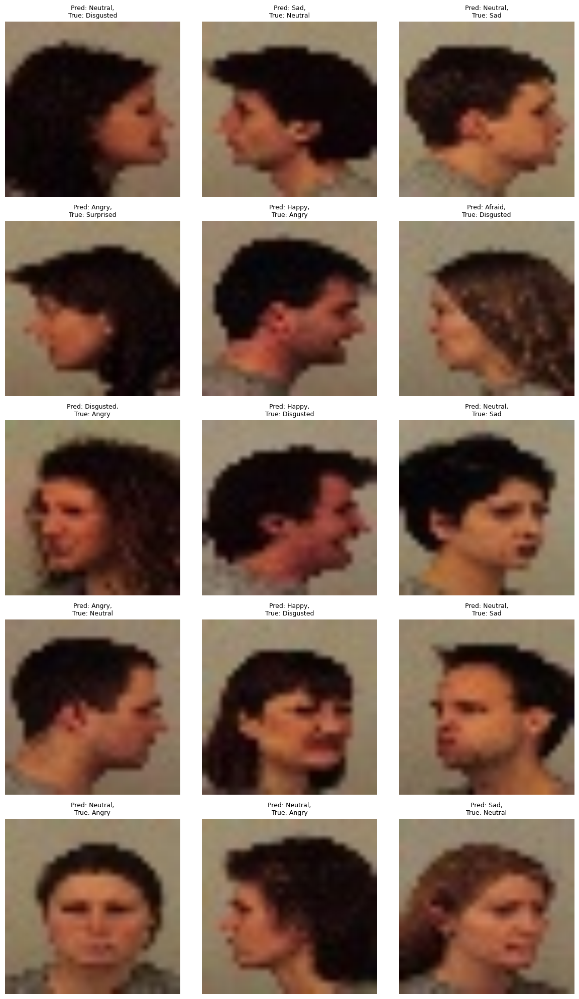




------------------------------------
 Accuracies  [0.7183673469387756, 0.7224489795918368, 0.7387755102040817, 0.6979591836734694, 0.6877551020408164, 0.6959183673469388, 0.7020408163265307, 0.6979591836734694, 0.6612244897959184, 0.7244897959183674]





'best_model/VGG16_best_model.pt'

In [11]:
import torch
import os
import numpy as np
import shutil
from torch import nn, optim
from torch.optim import lr_scheduler
from torchvision import models
from torch.utils.tensorboard import SummaryWriter

accuracies = []
index = list(np.random.permutation(4900))

best_overall_acc = 0.0
best_model_path = ""

for i in range(10):
    idx = {
        'val': index[490 * i:490 * (i + 1)],
        'train': index[:i * 490] + index[((i + 1) * 490):]
    }

    dataloaders = {
        x: torch.utils.data.DataLoader(
            KDEFDataset(transforms_=data_transforms[x], idx=idx[x]),
            batch_size=32,
            shuffle=True
        )
        for x in ['train', 'val']
    }

    model_ft = models.vgg16(weights='IMAGENET1K_V1')
    num_ftrs = model_ft.classifier[6].in_features
    model_ft.classifier[6] = nn.Linear(num_ftrs, class_names)
    model_ft = model_ft.to(device)

    criterion = nn.CrossEntropyLoss()
    optimizer_ft = optim.SGD(model_ft.parameters(), lr=0.001, momentum=0.9)
    exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=6, gamma=0.1)

    logdir = f'./logs/VGG-16_kfold_{i}'
    os.makedirs(logdir, exist_ok=True)
    writer = SummaryWriter(logdir)

    os.makedirs('saved', exist_ok=True)

    model_ft, best_acc = train_model(
        model_ft,
        criterion,
        optimizer_ft,
        exp_lr_scheduler,
        dataloaders,
        writer,
        i,
        num_epochs=20
    )

    model_path = f'saved/model_fold_{i}.pt'
    torch.save(model_ft.state_dict(), model_path)

    if best_acc > best_overall_acc:
        best_overall_acc = best_acc
        best_model_path = model_path

    print(f"Showing misclassified examples for fold {i}...")
    visualize_model_misclassified(
        model=model_ft,
        dataloader=dataloaders['val'],
        class_names={
            0: "Afraid", 1: "Angry", 2: "Disgusted",
            3: "Happy", 4: "Neutral", 5: "Sad", 6: "Surprised"
        },
        save_dir=f'misclassified/fold_{i}',
        num_images=15,
    )

    accuracies.append(float(best_acc.cpu().numpy()))
    print("\n\n\n------------------------------------\n Accuracies ", accuracies)
    print("\n\n")


os.makedirs('best_model', exist_ok=True)
shutil.copy(best_model_path, 'best_model/VGG16_best_model.pt')



In [12]:
from google.colab import files

!zip -r VGG16_28x28_logs_best_model.zip logs misclassified best_model
files.download('VGG16_28x28_logs_best_model.zip')

  adding: logs/ (stored 0%)
  adding: logs/VGG-16_kfold_0/ (stored 0%)
  adding: logs/VGG-16_kfold_0/events.out.tfevents.1744925982.4cbc737ca20f.2839.0 (deflated 61%)
  adding: logs/VGG-16_kfold_8/ (stored 0%)
  adding: logs/VGG-16_kfold_8/events.out.tfevents.1744928656.4cbc737ca20f.2839.8 (deflated 61%)
  adding: logs/VGG-16_kfold_4/ (stored 0%)
  adding: logs/VGG-16_kfold_4/events.out.tfevents.1744927318.4cbc737ca20f.2839.4 (deflated 61%)
  adding: logs/VGG-16_kfold_7/ (stored 0%)
  adding: logs/VGG-16_kfold_7/events.out.tfevents.1744928325.4cbc737ca20f.2839.7 (deflated 62%)
  adding: logs/VGG-16_kfold_3/ (stored 0%)
  adding: logs/VGG-16_kfold_3/events.out.tfevents.1744926981.4cbc737ca20f.2839.3 (deflated 62%)
  adding: logs/VGG-16_kfold_6/ (stored 0%)
  adding: logs/VGG-16_kfold_6/events.out.tfevents.1744927993.4cbc737ca20f.2839.6 (deflated 61%)
  adding: logs/VGG-16_kfold_5/ (stored 0%)
  adding: logs/VGG-16_kfold_5/events.out.tfevents.1744927653.4cbc737ca20f.2839.5 (deflated 61%)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>